Import Libraries

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt 
import folium

Load Dataset

In [4]:
# read csv file and save into dataframe df
df = pd.read_csv("Airbnb Listings Bangkok.csv")

df.head()

,Unnamed: 0,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0
1,1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,NaN,NaN,2,358,0
2,2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,NaN,NaN,1,365,0
3,3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1
4,4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,NaN,NaN,3,365,0


Basic Dataset Information

In [5]:
# df.info()

Droping redundant "Unnamed" column

In [6]:
df = df.drop(columns=["Unnamed: 0"])
# df.head()

Find duplicates and handle accordingly

In [7]:
df.duplicated().sum()
# no duplicates

np.int64(0)

Find missing values and handle accordingly

In [8]:
# df.isnull().sum()

In [9]:
# len(df[df["number_of_reviews"] == 0])

In [10]:
# check name column missing values
# df[df["name"].isna()]

In [11]:
# since name are descrptive titles, replace them with placeholder value of "Unknown"
# df["name"].fillna("Unknown", inplace=True)
df.fillna({"name": "Unknown"}, inplace=True)

In [12]:
# double check name column missing values
# df[df["name"].isna()]

# no more name column missing values

In [13]:
# check host_name column missing values
# df[df["host_name"].isna()]

In [14]:
# since host_name is not too important in the analysis, replace them with placeholder value of "Unknown"
df.fillna({"host_name": "Unknown"}, inplace=True)

In [15]:
# double check host_name column missing values
# df[df["host_name"].isna()]

# no more host_name column missing values

In [16]:
# check last_review and reviews_per_month column
# df[df["last_review"].isna() & df["reviews_per_month"].isna()]

In [17]:
# last_review column has 5790 missing values
# reviews_per_month column has 5790 missing values
# above shows 5790 missing values --> btoh last_review and reviews_per_month column falls under the same rows
# last_review can be replaced with placeholder value of "No review" --> since last_review is an object format
# reviews_per_month can be replaced with 0 (no last_review means no reviews were made in any month)

df.fillna({"last_review": "No Review"}, inplace=True)
df.fillna({"reviews_per_month": 0}, inplace=True)

In [18]:
# double check last_review and reviews_per_month column
# df[df["last_review"].isna() & df["reviews_per_month"].isna()]

# no more missing values

In [19]:
# double check all columns for missing values
# df.isnull().sum()

Dataset information after cleaning up missing values

In [20]:
# df.describe()

# Main Topic

Best Areas for AirBnb Investment in Bangkok
<br>
Analyze which neighborhoods have the highest revenue potential

In [21]:
# number of different neighbourhood
# df["neighbourhood"].nunique()

In [22]:
# number of different room_type
# df["room_type"].nunique()

- want to check the difference in prices between the different types of rooms in different neighbourhoods
- logically, the different types of rooms would heva different pricings

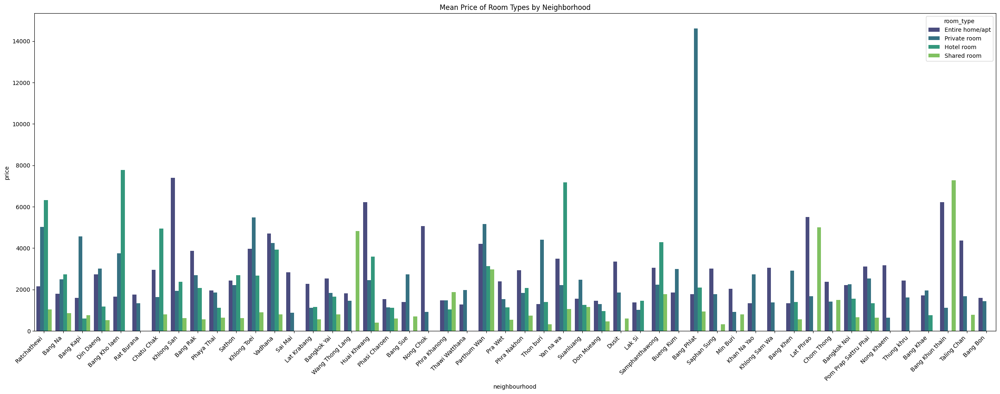

In [23]:
# create graph to see the mean prices of each room_type in each neighbourhood

plt.figure(figsize=(30, 10))
sns.barplot(x = "neighbourhood", y = "price", data = df, hue = "room_type", estimator=np.mean, errorbar= None, palette="viridis")
plt.title("Mean Price of Room Types by Neighborhood")
plt.xticks(rotation=45, ha="right");

- too many neighbourhoods --> difficult to visualise
- separate into different zones based on enighbourhood median longitude nad latitude (central, northeast, northwest, southeast, southwest)

In [24]:
neighborhood_medians = df.groupby("neighbourhood")[["latitude", "longitude"]].median().reset_index()

In [25]:
# find the median of latitude and longitude
median_lat = df["latitude"].median()    # to divide north vs south
median_lon = df["longitude"].median()   # to divide east vs west

# create function to assign regions based on lat lon
def assign_region(lat, lon):

    lat_q1, lat_q3 = df["latitude"].quantile([0.25, 0.75])
    lon_q1, lon_q3 = df["longitude"].quantile([0.25, 0.75])
    iqr_lat = lat_q3 - lat_q1
    iqr_lon = lon_q3 - lon_q1
    
    # Adjust Central Region
    central_lat_min = lat_q1
    central_lat_max = lat_q3
    central_lon_min = lon_q1
    central_lon_max = lon_q3
    
    if central_lat_min <= lat <= central_lat_max and central_lon_min <= lon <= central_lon_max: # central area range
        return "Central"
    elif lat >= median_lat and lon > median_lon:
        return "Northeast"
    elif lat >= median_lat and lon <= median_lon:
        return "Northwest"
    elif lat < median_lat and lon > median_lon:
        return "Southeast"
    elif lat < median_lat and lon <= median_lon:
        return "Southwest"


In [26]:
lat_q1, lat_q3 = df["latitude"].quantile([0.25, 0.75])
lon_q1, lon_q3 = df["longitude"].quantile([0.25, 0.75])
iqr_lat = lat_q3 - lat_q1
iqr_lon = lon_q3 - lon_q1

# print("Latitude IQR: " + str(iqr_lat))
# print("Longitude IQR: " + str(iqr_lon))

In [27]:
neighborhood_medians["region"] = neighborhood_medians.apply(
    lambda row: assign_region(row["latitude"], row["longitude"]), axis=1
)


In [28]:
df = df.merge(neighborhood_medians[["neighbourhood", "region"]], on="neighbourhood", how="left")
# df.head()

In [29]:
# check number of entries for each region
# df["region"].value_counts()

create map for distribution of listings per region

In [30]:
# Define a color mapping for your regions
region_colors = {
    "Central": "red",
    "Northeast": "blue",
    "Southwest": "green",
    "Northwest": "purple",
    "Southeast": "orange"
}

# Create a base map centered around the average coordinates
map_center = [df["latitude"].mean(), df["longitude"].mean()]
m = folium.Map(location=map_center, zoom_start=12)

# Add points for each listing
for _, row in df.iterrows():
    folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=2,
        color=region_colors.get(row["region"], "black"),
        fill=True,
        fill_color=region_colors.get(row["region"], "black"),
        fill_opacity=0.6,
    ).add_to(m)

# Show the map
m

In [31]:
df.head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,region
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0,Central
1,27979,"Easy going landlord,easy place",120541,Emy,Bang Na,13.66818,100.61674,Private room,1316,1,0,No Review,0.00,2,358,0,Southeast
2,28745,modern-style apartment in Bangkok,123784,Familyroom,Bang Kapi,13.75232,100.62402,Private room,800,60,0,No Review,0.00,1,365,0,Northeast
3,35780,Spacious one bedroom at The Kris Condo Bldg. 3,153730,Sirilak,Din Daeng,13.78823,100.57256,Private room,1286,7,2,2022-04-01,0.03,1,323,1,Northeast
4,941865,Suite Room 3 at MetroPoint,610315,Kasem,Bang Kapi,13.76872,100.63338,Private room,1905,1,0,No Review,0.00,3,365,0,Northeast


clean up room_type categorisation

In [32]:
# df["room_type"].value_counts()

In [33]:
# df[df["room_type"] == "Entire home/apt"]

In [34]:
# df[df["room_type"] == "Hotel room"]

In [35]:
# df[df["room_type"] == "Shared room"]

In [36]:
# df[df["room_type"] == "Private room"]

In [37]:
eha_keywords = ["house", "home", "apartment", "apt", "condo", "villa"] # keywords for entire home/apt
hr_keywords = ["hotel"]    # keywords for hotel room
sr_keywords = ["dorm", "hostel", "capsule"] # keywords for shared room
# private room will logically be the rest

In [38]:
for index, row in df.iterrows():
    if any(keyword in row["name"].lower() for keyword in eha_keywords):  # Entire home/apt
        df.loc[index, "room_type"] = "Entire home/apt"
    elif any(keyword in row["name"].lower() for keyword in hr_keywords):  # Hotel room
        df.loc[index, "room_type"] = "Hotel room"
    elif any(keyword in row["name"].lower() for keyword in sr_keywords):  # Shared room
        df.loc[index, "room_type"] = "Shared room"
    else:  
        pass

In [39]:
# df[(df["name"].str.contains("Apartment", case=False, na=False)) & (df["room_type"] != "Entire home/apt")]

In [40]:
# check value counts
# df["room_type"].value_counts()

note that the amount for hotel increased mostly because some hotel rooms are incorrectly miscategorised as a private room

In [41]:
# create sub dataframes based on region
central_df = df[df["region"] == "Central"]
northeast_df = df[df["region"] == "Northeast"]
southwest_df = df[df["region"] == "Southwest"]
northwest_df = df[df["region"] == "Northwest"]
southeast_df = df[df["region"] == "Southeast"]

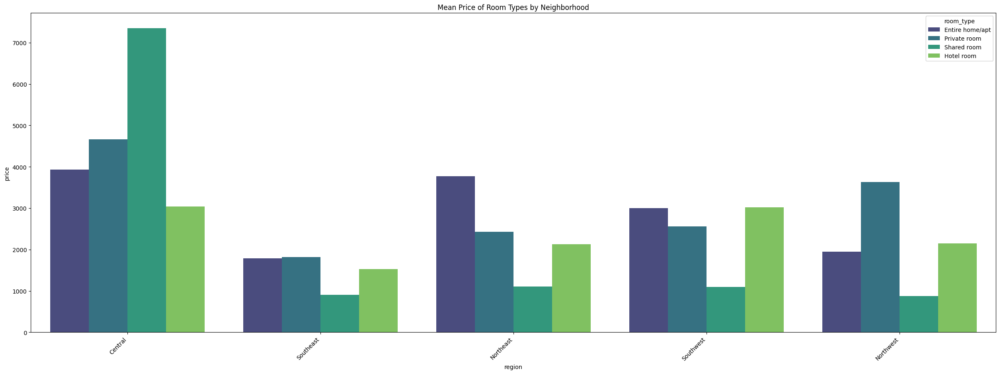

In [42]:
# create graph to see the mean prices of each room_type in each zonal area - for cleaning purposes

plt.figure(figsize=(30, 10))
sns.barplot(x = "region", y = "price", data = df, hue = "room_type", estimator=np.mean, errorbar= None, palette="viridis")
plt.title("Mean Price of Room Types by Neighborhood")
plt.xticks(rotation=45, ha="right");

In [ ]:
df

# Central

In [43]:
# central_df.head()

In [44]:
# central_df["neighbourhood"].value_counts()

In [45]:
# central_df["room_type"].value_counts()

In [46]:
# room_type price mean
# central_df.groupby("room_type")["price"].mean()

In [47]:
# # mean price of room_types in central
# plt.figure(figsize=(7, 7))
# sns.barplot(x = "room_type", y = "price", hue = "room_type", data = central_df, estimator=np.mean, errorbar= None, palette="Set2")
# plt.title("Mean Price of Room Types in Central Area")
# plt.xlabel("Room Types")
# plt.ylabel("Price Mean")

In [48]:
# room_type price median
# central_df.groupby("room_type")["price"].median()

In [49]:
# # median price of room_types in central
# plt.figure(figsize=(7, 7))
# sns.barplot(x = "room_type", y = "price", hue = "room_type", data = central_df, estimator=np.median, errorbar= None, palette="viridis")
# plt.title("Median Price of Room Types in Central Area")
# plt.xlabel("Room Types")
# plt.ylabel("Price Mean")

In [50]:
# # create boxplot to see distribution of room_type price side by side
# plt.figure(figsize=(7, 7))
# sns.boxplot(x = "room_type", y = "price", hue = "room_type", data = central_df, palette="viridis")
# plt.title("Distribution of Prices by Room Types in Central Area")
# plt.xlabel("Room Types")
# plt.ylabel("Price")

not normal distribution
<br>
there are outliers that needs to be addressed

In [51]:
# create dataframes for each room_type in central_df
central_eha = central_df[central_df["room_type"] == "Entire home/apt"]
central_pr = central_df[central_df["room_type"] == "Private room"]
central_hr = central_df[central_df["room_type"] == "Hotel room"]
central_sr = central_df[central_df["room_type"] == "Shared room"]

In [52]:
# check if dataframes created correctly
# len(central_eha)
# len(central_pr)
# len(central_hr)
# len(central_sr)

### entire home/apt

In [53]:
# len(central_eha)

In [54]:
# central_eha.head()

In [55]:
# central_eha.sort_values(by="price", ascending = False).head()

In [56]:
# # create histogram to see the distribution of price
# plt.figure(figsize=(10, 7))
# sns.histplot(data = central_eha, x="price", color = "#006884")
# plt.title("Distribution of Entire Home/Apt Prices in Central Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

remove extreme outliers manually

In [57]:
# central_eha.sort_values(by="price", ascending = False).head(10)

In [58]:
central_eha = central_eha[central_eha["price"] < 200000]

In [59]:
# plt.figure(figsize=(10, 7))
# sns.histplot(data = central_eha, x="price", color = "#006884")
# plt.title("Distribution of Entire Home/Apt Prices in Central Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

In [60]:
# central_eha.sort_values(by="price", ascending = False).head(10)

calculate iqr

In [61]:
# function to find the price outliers
def price_outlier(df):
    Q1 = df["price"].quantile(0.25)
    Q3 = df["price"].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    lower_outliers = df[df["price"] < lower_bound]
    upper_outliers = df[df["price"] > upper_bound]

    return lower_outliers, upper_outliers, lower_bound, upper_bound

In [62]:
# len(price_outlier(central_eha)[0])
# no lower outliers

In [63]:
# len(price_outlier(central_eha)[1])
# 341 upper outliers

remove outliers based on iqr

In [64]:
central_eha_cleaned = central_eha[central_eha["price"] < price_outlier(central_eha)[-1]]

In [65]:
# # histogram of cleaned central entire home/apt price distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = central_eha_cleaned, x="price", color = "#006884")
# plt.title("Distribution of Entire Home/Apt Prices in Central Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

### hotel room

In [66]:
# len(central_hr)

In [67]:
# central_hr.head()

In [68]:
# central_hr.sort_values(by = "price", ascending = False).head()

In [69]:
# # create histogram to see the distribution of price
# plt.figure(figsize=(10, 7))
# sns.histplot(data = central_hr, x="price", color = "#006884")
# plt.title("Distribution of Hotel Room Prices in Central Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

remove extreme outliers

In [70]:
central_hr = central_hr[central_hr["price"] < 15000]

In [71]:
# plt.figure(figsize=(10, 7))
# sns.histplot(data = central_hr, x="price", color = "#006884")
# plt.title("Distribution of Hotel Room Prices in Central Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

In [72]:
# len(price_outlier(central_hr)[0])
# len(price_outlier(central_hr)[1])

remove outliers based on iqr

In [73]:
central_hr_cleaned = central_hr[central_hr["price"] < price_outlier(central_hr)[-1]]

In [74]:
# # cleaned price distribtution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = central_hr_cleaned, x="price", color = "#006884")
# plt.title("Distribution of Hotel Room Prices in Central Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

### private room

In [75]:
# len(central_pr)

In [76]:
# central_pr.head()

In [77]:
# central_pr.sort_values(by = "price", ascending = False).head()

In [78]:
# # histogram to see raw distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = central_pr, x="price", color = "#006884")
# plt.title("Distribution of Private Room Prices in Central Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

remove extreme outliers

In [79]:
central_pr = central_pr[central_pr["price"] < 50000]

In [80]:
# plt.figure(figsize=(10, 7))
# sns.histplot(data = central_pr, x="price", color = "#006884")
# plt.title("Distribution of Private Room Prices in Central Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

In [81]:
# len(price_outlier(central_pr)[0])
# len(price_outlier(central_pr)[1])

remove outliers based on iqr

In [82]:
central_pr_cleaned = central_pr[central_pr["price"] < price_outlier(central_pr)[-1]]

In [83]:
# # cleaned distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = central_pr_cleaned, x="price", color = "#006884")
# plt.title("Distribution of Private Room Prices in Central Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

### shared room

In [84]:
# len(central_sr)

In [85]:
# central_sr.head()

In [86]:
# central_sr.sort_values(by = "price", ascending = False).head()

In [87]:
# # raw data distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = central_sr, x="price", color = "#006884")
# plt.title("Distribution of Shared Room Prices in Central Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

remove extreme outliers

In [88]:
central_sr = central_sr[central_sr["price"] < 10000]

In [89]:
# plt.figure(figsize=(10, 7))
# sns.histplot(data = central_sr, x="price", color = "#006884")
# plt.title("Distribution of Shared Room Prices in Central Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

In [90]:
# len(price_outlier(central_sr)[0])
# len(price_outlier(central_sr)[1])

remove outliers based on iqr

In [91]:
central_sr_cleaned = central_sr[central_sr["price"] < price_outlier(central_sr)[-1]]

In [92]:
# # cleaned data distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = central_sr_cleaned, x="price", color = "#006884")
# plt.title("Distribution of Shared Room Prices in Central Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

#### combine all cleaned room_type dataframes for central

In [93]:
central_df_cleaned = pd.concat([central_eha_cleaned, central_hr_cleaned, central_pr_cleaned, central_sr_cleaned])

In [94]:
# len(central_df_cleaned)

In [95]:
# # double check if concat worked properly
# len(central_eha_cleaned) + len(central_hr_cleaned) + len(central_pr_cleaned) + len(central_sr_cleaned)

Text(0, 0.5, 'Price')

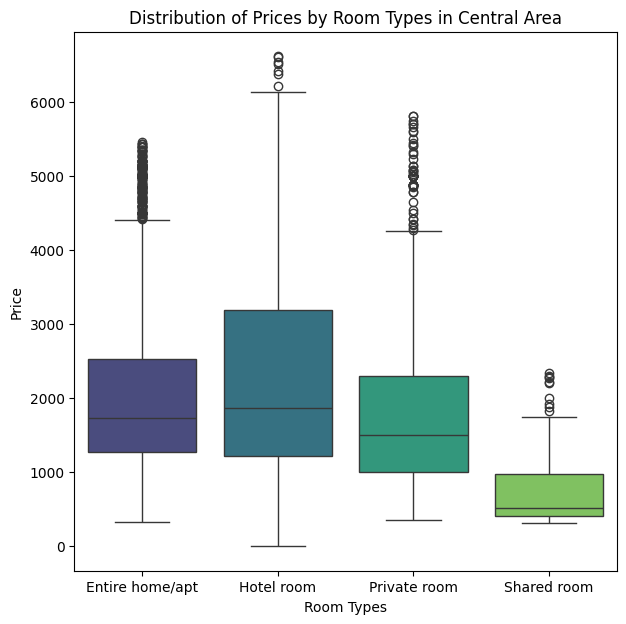

In [96]:
# clean boxplot to see distribution of room_type price side by side
plt.figure(figsize=(7, 7))
sns.boxplot(x = "room_type", y = "price", hue = "room_type", data = central_df_cleaned, palette="viridis")
plt.title("Distribution of Prices by Room Types in Central Area")
plt.xlabel("Room Types")
plt.ylabel("Price")

# Northwest

In [97]:
# len(northwest_df)

In [98]:
# northwest_df.head()

In [99]:
# northwest_df["neighbourhood"].value_counts()

In [100]:
# northwest_df["room_type"].value_counts()

In [101]:
# room_type price mean
# northwest_df.groupby("room_type")["price"].mean()

In [102]:
# # mean price of room_types in northwest
# plt.figure(figsize=(7, 7))
# sns.barplot(x = "room_type", y = "price", hue = "room_type", data = northwest_df, estimator=np.mean, errorbar= None, palette="viridis")
# plt.title("Mean Price of Room Types in Northwest Area")
# plt.xlabel("Room Types")
# plt.ylabel("Price Mean")

In [103]:
# # room_type price median
# northwest_df.groupby("room_type")["price"].median()

In [104]:
# # median price of room_types in northwest
# plt.figure(figsize=(7, 7))
# sns.barplot(x = "room_type", y = "price", hue = "room_type", data = northwest_df, estimator=np.median, errorbar= None, palette="viridis")
# plt.title("Median Price of Room Types in Northwest Area")
# plt.xlabel("Room Types")
# plt.ylabel("Price Mean")


In [105]:
# # create boxplot to see distribution of room_type price side by side
# plt.figure(figsize=(7, 7))
# sns.boxplot(x = "room_type", y = "price", hue = "room_type", data = northwest_df, palette="viridis")
# plt.title("Distribution of Prices by Room Types in Northwest Area")
# plt.xlabel("Room Types")
# plt.ylabel("Price")

not normally distributed
<br>
outliers need to be addressed

In [106]:
# create dataframes for each room_type in northwest_df
nw_eha = northwest_df[northwest_df["room_type"] == "Entire home/apt"]
nw_pr = northwest_df[northwest_df["room_type"] == "Private room"]
nw_hr = northwest_df[northwest_df["room_type"] == "Hotel room"]
nw_sr = northwest_df[northwest_df["room_type"] == "Shared room"]

### entire home/apt

In [107]:
# len(nw_eha)

In [108]:
# nw_eha.head()

In [109]:
# nw_eha.sort_values(by = "price", ascending = False).head()

In [110]:
# # raw data histogram for prices of entire home/apt in northwest area
# plt.figure(figsize=(10, 7))
# sns.histplot(data = nw_eha, x="price", color = "#006884")
# plt.title("Distribution of Entire Home/Apt Prices in Northwest Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

remove extreme outliers

In [111]:
nw_eha = nw_eha[nw_eha["price"] < 15000]

In [112]:
# plt.figure(figsize=(10, 7))
# sns.histplot(data = nw_eha, x="price", color = "#006884")
# plt.title("Distribution of Entire Home/Apt Prices in Northwest Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

In [113]:
len(price_outlier(nw_eha)[0])
len(price_outlier(nw_eha)[1])

80

remove outliers based on iqr

In [114]:
nw_eha_cleaned = nw_eha[nw_eha["price"] < price_outlier(nw_eha)[-1]]

In [115]:
# # cleaned distribution of price
# plt.figure(figsize=(10, 7))
# sns.histplot(data = nw_eha_cleaned, x="price", color = "#006884")
# plt.title("Distribution of Entire Home/Apt Prices in Northwest Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

### hotel room

In [116]:
# len(nw_hr)

In [117]:
# nw_hr.head()

In [118]:
# nw_hr.sort_values(by = "price", ascending = False).head()

In [119]:
# # raw data histogram
# plt.figure(figsize=(10, 7))
# sns.histplot(data = nw_hr, x="price", color = "#006884")
# plt.title("Distribution of Hotel Room Prices in Northwest Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

remove extreme outliers

In [120]:
nw_hr = nw_hr[nw_hr["price"] < 12000]

In [121]:
# plt.figure(figsize=(10, 7))
# sns.histplot(data = nw_hr, x="price", color = "#006884")
# plt.title("Distribution of Hotel Room Prices in Northwest Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

In [122]:
# len(price_outlier(nw_hr)[0])
# len(price_outlier(nw_hr)[1])

remove outliers based on iqr

In [123]:
nw_hr_cleaned = nw_hr[nw_hr["price"] < price_outlier(nw_hr)[-1]]

In [124]:
# # cleaned distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = nw_hr_cleaned, x="price", color = "#006884")
# plt.title("Distribution of Hotel Room Prices in Northwest Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

### private room

In [125]:
# len(nw_pr)

In [126]:
# nw_pr.head()

In [127]:
# nw_pr.sort_values(by = "price", ascending = False).head()

In [128]:
# # raw data histogram
# plt.figure(figsize=(10, 7))
# sns.histplot(data = nw_pr, x="price", color = "#006884")
# plt.title("Distribution of Private Room Prices in Northwest Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

remove extreme outliers

In [129]:
nw_pr = nw_pr[nw_pr["price"] < 100000]

In [130]:
# plt.figure(figsize=(10, 7))
# sns.histplot(data = nw_pr, x="price", color = "#006884")
# plt.title("Distribution of Private Room Prices in Northwest Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

In [131]:
# len(price_outlier(nw_pr)[0])
# len(price_outlier(nw_pr)[1])

remove outliers based on iqr

In [132]:
nw_pr_cleaned = nw_pr[nw_pr["price"] < price_outlier(nw_pr)[-1]]

In [133]:
# # cleaned distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = nw_pr_cleaned, x="price", color = "#006884")
# plt.title("Distribution of Private Room Prices in Northwest Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

### shared room

In [134]:
# len(nw_sr)

In [135]:
# nw_sr.head()

In [136]:
# # raw data distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = nw_sr, x="price", color = "#006884")
# plt.title("Distribution of Shared Room Prices in Northwest Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

remove extreme outliers

In [137]:
nw_sr = nw_sr[nw_sr["price"] < 7500]

In [138]:
# plt.figure(figsize=(10, 7))
# sns.histplot(data = nw_sr, x="price", color = "#006884")
# plt.title("Distribution of Shared Room Prices in Northwest Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

In [139]:
# len(price_outlier(nw_sr)[0])
# len(price_outlier(nw_sr)[1])

remove outliers based on iqr

In [140]:
nw_sr_cleaned = nw_sr[nw_sr["price"] < price_outlier(nw_sr)[-1]]

In [141]:
# # cleaned distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = nw_sr_cleaned, x="price", color = "#006884")
# plt.title("Distribution of Shared Room Prices in Northwest Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

#### combine all cleaned room_type dataframes for northwest

In [142]:
northwest_df_cleaned = pd.concat([nw_eha_cleaned, nw_hr_cleaned, nw_pr_cleaned, nw_sr_cleaned])

In [143]:
# len(northwest_df_cleaned)

In [144]:
# double check if concat worked properly
# len(nw_eha_cleaned) + len(nw_hr_cleaned) + len(nw_pr_cleaned) + len(nw_sr_cleaned)

Text(0, 0.5, 'Price')

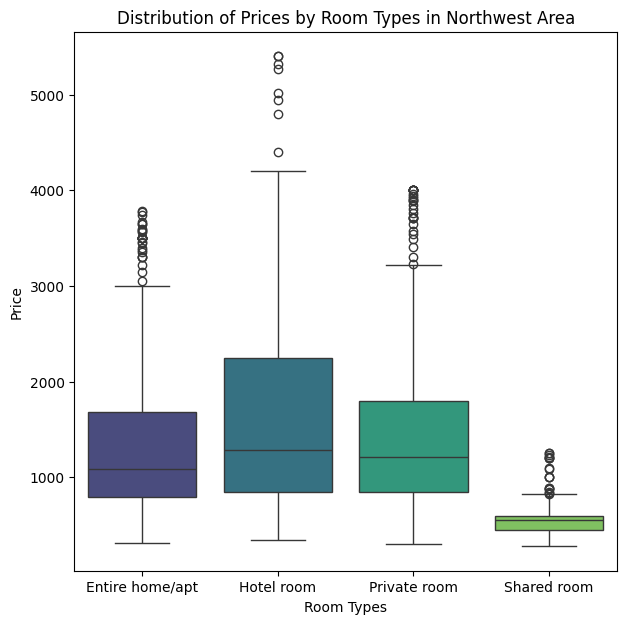

In [145]:
# clean boxplot to see distribution of room_type price side by side
plt.figure(figsize=(7, 7))
sns.boxplot(x = "room_type", y = "price", hue = "room_type", data = northwest_df_cleaned, palette="viridis")
plt.title("Distribution of Prices by Room Types in Northwest Area")
plt.xlabel("Room Types")
plt.ylabel("Price")

# Northeast

In [146]:
# len(northeast_df)

In [147]:
# northeast_df.head()

In [148]:
# northeast_df["neighbourhood"].value_counts()

In [149]:
# northeast_df["room_type"].value_counts()

In [150]:
# room_type price mean
# northeast_df.groupby("room_type")["price"].mean()

In [151]:
# # mean price of room_types in northeast
# plt.figure(figsize=(7, 7))
# sns.barplot(x = "room_type", y = "price", hue = "room_type", data = northeast_df, estimator=np.mean, errorbar= None, palette="viridis")
# plt.title("Mean Price of Room Types in Northeast Area")
# plt.xlabel("Room Types")
# plt.ylabel("Price Mean")

In [152]:
# room_type price median
# northeast_df.groupby("room_type")["price"].median()

In [153]:
# # median price of room_types in northeast
# plt.figure(figsize=(7, 7))
# sns.barplot(x = "room_type", y = "price", hue = "room_type", data = northeast_df, estimator=np.median, errorbar= None, palette="viridis")
# plt.title("Mean Price of Room Types in Northeast Area")
# plt.xlabel("Room Types")
# plt.ylabel("Price Mean")

In [154]:
# # create boxplot to see distribution of room_type price side by side
# plt.figure(figsize=(7, 7))
# sns.boxplot(x = "room_type", y = "price", hue = "room_type", data = northeast_df, palette="viridis")
# plt.title("Distribution of Prices by Room Types in Northeast Area")
# plt.xlabel("Room Types")
# plt.ylabel("Price")

not normally distributed
<br>
need to take care of outliers

In [155]:
# create dataframes based on room_type
ne_eha = northeast_df[northeast_df["room_type"] == "Entire home/apt"]
ne_hr = northeast_df[northeast_df["room_type"] == "Hotel room"]
ne_pr = northeast_df[northeast_df["room_type"] == "Private room"]
ne_sr = northeast_df[northeast_df["room_type"] == "Shared room"]

### entire home/apt

In [156]:
# len(ne_eha)

In [157]:
# ne_eha.head()

In [158]:
# ne_eha.sort_values(by = "price", ascending = False).head(20)

In [159]:
# # raw data distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = ne_eha, x="price", color = "#006884")
# plt.title("Distribution of Entire Home/Apt Prices in Northeast Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

remove extreme outliers

In [160]:
ne_eha = ne_eha[ne_eha["price"] < 60000]

In [161]:
# plt.figure(figsize=(10, 7))
# sns.histplot(data = ne_eha, x="price", color = "#006884")
# plt.title("Distribution of Entire Home/Apt Prices in Northeast Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

In [162]:
# len(price_outlier(ne_eha)[0])
# len(price_outlier(ne_eha)[1])

remove outliers based on iqr

In [163]:
ne_eha_cleaned = ne_eha[ne_eha["price"] < price_outlier(ne_eha)[-1]]

In [164]:
# # cleaned data distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = ne_eha_cleaned, x="price", color = "#006884")
# plt.title("Distribution of Entire Home/Apt Prices in Northeast Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

### hotel room

In [165]:
# len(ne_hr)

In [166]:
# ne_hr.head()

In [167]:
# ne_hr.sort_values(by = "price", ascending = False).head()

In [168]:
# # raw data distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = ne_hr, x="price", color = "#006884")
# plt.title("Distribution of Hotel Room Prices in Northeast Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

In [169]:
ne_hr = ne_hr[ne_hr["price"] < 17500]

In [170]:
# plt.figure(figsize=(10, 7))
# sns.histplot(data = ne_hr, x="price", color = "#006884")
# plt.title("Distribution of Hotel Room Prices in Northeast Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

In [171]:
# len(price_outlier(ne_hr)[0])
# len(price_outlier(ne_hr)[1])

remove outliers based on iqr

In [172]:
ne_hr_cleaned = ne_hr[ne_hr["price"] < price_outlier(ne_hr)[-1]]

In [173]:
# # cleaned distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = ne_hr_cleaned, x="price", color = "#006884")
# plt.title("Distribution of Hotel Room Prices in Northeast Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

### private room

In [174]:
# len(ne_pr)

In [175]:
# ne_pr.head()

In [176]:
# ne_pr.sort_values(by = "price", ascending = False).head(20)

In [177]:
# # raw data distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = ne_pr, x="price", color = "#006884")
# plt.title("Distribution of Private Room Prices in Northeast Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

remove extreme outliers

In [178]:
ne_pr = ne_pr[ne_pr["price"] < 100000]

In [179]:
# plt.figure(figsize=(10, 7))
# sns.histplot(data = ne_pr, x="price", color = "#006884")
# plt.title("Distribution of Private Room Prices in Northeast Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

In [180]:
# len(price_outlier(ne_pr)[0])
# len(price_outlier(ne_pr)[1])

remove outliers based on iqr

In [181]:
ne_pr_cleaned = ne_pr[ne_pr["price"] < price_outlier(ne_pr)[-1]]

In [182]:
# # cleaned distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = ne_pr_cleaned, x="price", color = "#006884")
# plt.title("Distribution of Private Room Prices in Northeast Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

### shared room

In [183]:
# len(ne_sr)

In [184]:
# ne_sr.head()

In [185]:
# ne_sr.sort_values(by = "price", ascending = False).head()

In [186]:
# # raw data distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = ne_sr, x="price", color = "#006884")
# plt.title("Distribution of Shared Room Prices in Northeast Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

remove extreme outlier

In [187]:
ne_sr = ne_sr[ne_sr["price"] < 10000]

In [188]:
# plt.figure(figsize=(10, 7))
# sns.histplot(data = ne_sr, x="price", color = "#006884")
# plt.title("Distribution of Shared Room Prices in Northeast Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

In [189]:
# len(price_outlier(ne_sr)[0])
# len(price_outlier(ne_sr)[1])

remove outliers based on iqr

In [190]:
ne_sr_cleaned = ne_sr[ne_sr["price"] < price_outlier(ne_sr)[-1]]

In [191]:
# # cleaned distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = ne_sr_cleaned, x="price", color = "#006884")
# plt.title("Distribution of Shared Room Prices in Northeast Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

#### combine all cleaned room_type dataframes for northeast

In [192]:
northeast_df_cleaned = pd.concat([ne_eha_cleaned, ne_hr_cleaned, ne_pr_cleaned, ne_sr_cleaned])

In [193]:
# len(northeast_df_cleaned)

In [194]:
# double check if concat worked properly
# len(ne_eha_cleaned) + len(ne_hr_cleaned) + len(ne_pr_cleaned) + len(ne_sr_cleaned)

Text(0, 0.5, 'Price')

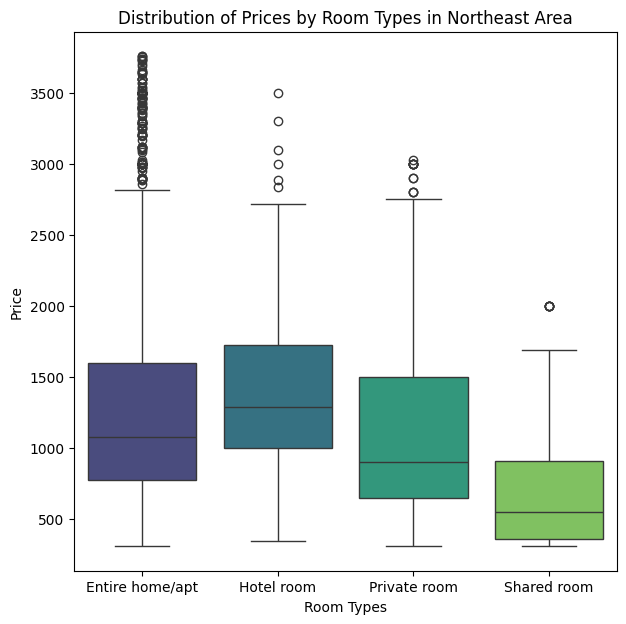

In [195]:
# clean boxplot to see distribution of room_type price side by side
plt.figure(figsize=(7, 7))
sns.boxplot(x = "room_type", y = "price", hue = "room_type", data = northeast_df_cleaned, palette="viridis")
plt.title("Distribution of Prices by Room Types in Northeast Area")
plt.xlabel("Room Types")
plt.ylabel("Price")

# Southwest

In [196]:
# len(southwest_df)

In [197]:
# southwest_df.head()

In [198]:
# southwest_df["neighbourhood"].value_counts()

In [199]:
# southwest_df["room_type"].value_counts()

In [200]:
# room_type price mean
# southwest_df.groupby("room_type")["price"].mean()

In [201]:
# # mean price of room_types in southwest
# plt.figure(figsize=(7, 7))
# sns.barplot(x = "room_type", y = "price", hue = "room_type", data = southwest_df, estimator=np.mean, errorbar= None, palette="viridis")
# plt.title("Mean Price of Room Types in Southwest Area")
# plt.xlabel("Room Types")
# plt.ylabel("Price Mean")


In [202]:
# room_type price median
# southwest_df.groupby("room_type")["price"].median()

In [203]:
# # median price of room_types in southwest
# plt.figure(figsize=(7, 7))
# sns.barplot(x = "room_type", y = "price", hue = "room_type", data = southwest_df, estimator=np.median, errorbar= None, palette="viridis")
# plt.title("Mean Price of Room Types in Southwest Area")
# plt.xlabel("Room Types")
# plt.ylabel("Price Mean")

In [204]:
# # create boxplot to see distribution of room_type price side by side
# plt.figure(figsize=(7, 7))
# sns.boxplot(x = "room_type", y = "price", hue = "room_type", data = southwest_df, palette="viridis")
# plt.title("Distribution of Prices by Room Types in Southwest Area")
# plt.xlabel("Room Types")
# plt.ylabel("Price")

not normally distributed
<br>
outliers need to be handled by room_types

In [205]:
# create dataframes based on room_type
sw_eha = southwest_df[southwest_df["room_type"] == "Entire home/apt"]
sw_hr = southwest_df[southwest_df["room_type"] == "Hotel room"]
sw_pr = southwest_df[southwest_df["room_type"] == "Private room"]
sw_sr = southwest_df[southwest_df["room_type"] == "Shared room"]

### entire home/apt

In [206]:
# len(sw_eha)

In [207]:
# sw_eha.head()

In [208]:
# sw_eha.sort_values(by = "price", ascending = False).head(10)

In [209]:
# # raw data distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = sw_eha, x="price", color = "#006884")
# plt.title("Distribution of Entire Home/Apt Prices in Southwest Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

remove extreme outliers

In [210]:
sw_eha = sw_eha[sw_eha["price"] < 100000]

In [211]:
# plt.figure(figsize=(10, 7))
# sns.histplot(data = sw_eha, x="price", color = "#006884")
# plt.title("Distribution of Entire Home/Apt Prices in Southwest Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

In [212]:
len(price_outlier(sw_eha)[0])
len(price_outlier(sw_eha)[1])

150

remove outliers based on iqr

In [213]:
sw_eha_cleaned = sw_eha[sw_eha["price"] < price_outlier(sw_eha)[-1]]

In [214]:
# # cleaned distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = sw_eha_cleaned, x="price", color = "#006884")
# plt.title("Distribution of Entire Home/Apt Prices in Southwest Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

### hotel room

In [215]:
# len(sw_hr)

In [216]:
# sw_hr.head()

In [217]:
# sw_hr.sort_values(by = "price", ascending = False).head(10)

In [218]:
# # raw data distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = sw_hr, x="price", color = "#006884")
# plt.title("Distribution of Hotel Room Prices in Southwest Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

In [219]:
# len(price_outlier(sw_hr)[0])
# len(price_outlier(sw_hr)[1])

remove outliers based on iqr

In [220]:
sw_hr_cleaned = sw_hr[sw_hr["price"] < price_outlier(sw_hr)[-1]]

In [221]:
# # cleaned data distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = sw_hr_cleaned, x="price", color = "#006884")
# plt.title("Distribution of Hotel Room Prices in Southwest Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

### private room

In [222]:
# len(sw_pr)

In [223]:
# sw_pr.head()

In [224]:
# sw_pr.sort_values(by = "price", ascending = False).head()

In [225]:
# # raw data distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = sw_pr, x="price", color = "#006884")
# plt.title("Distribution of Private Room Prices in Southwest Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

remove extreme outliers

In [226]:
sw_pr = sw_pr[sw_pr["price"] < 40000]

In [227]:
# plt.figure(figsize=(10, 7))
# sns.histplot(data = sw_pr, x="price", color = "#006884")
# plt.title("Distribution of Private Room Prices in Southwest Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

In [228]:
len(price_outlier(sw_pr)[0])
len(price_outlier(sw_pr)[1])

65

remove outliers based on iqr

In [229]:
sw_pr_cleaned = sw_pr[sw_pr["price"] < price_outlier(sw_pr)[-1]]

In [230]:
# # cleaned distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = sw_pr_cleaned, x="price", color = "#006884")
# plt.title("Distribution of Private Room Prices in Southwest Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

### shared room

In [231]:
# len(sw_sr)

In [232]:
# sw_sr.head()

In [233]:
# sw_sr.sort_values(by = "price", ascending = False).head()

In [234]:
# # raw data distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = sw_sr, x="price", color = "#006884")
# plt.title("Distribution of Shared Room Prices in Southwest Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

remove extreme outliers

In [235]:
sw_sr = sw_sr[sw_sr["price"] < 6000]

In [236]:
# plt.figure(figsize=(10, 7))
# sns.histplot(data = sw_sr, x="price", color = "#006884")
# plt.title("Distribution of Shared Room Prices in Southwest Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

In [237]:
# len(price_outlier(sw_sr)[0])
# len(price_outlier(sw_sr)[1])

remove outliers based on iqr

In [238]:
sw_sr_cleaned = sw_sr[sw_sr["price"] < price_outlier(sw_sr)[-1]]

In [239]:
# # cleaned distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = sw_sr_cleaned, x="price", color = "#006884")
# plt.title("Distribution of Shared Room Prices in Southwest Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

#### combine all cleaned room_type dataframe for southwest

In [240]:
southwest_df_cleaned = pd.concat([sw_eha_cleaned, sw_hr_cleaned, sw_pr_cleaned, sw_sr_cleaned])

In [241]:
# len(southwest_df_cleaned)

In [242]:
# check if concat worked properly
# len(sw_eha_cleaned) + len(sw_hr_cleaned) + len(sw_pr_cleaned) + len(sw_sr_cleaned)

Text(0, 0.5, 'Price')

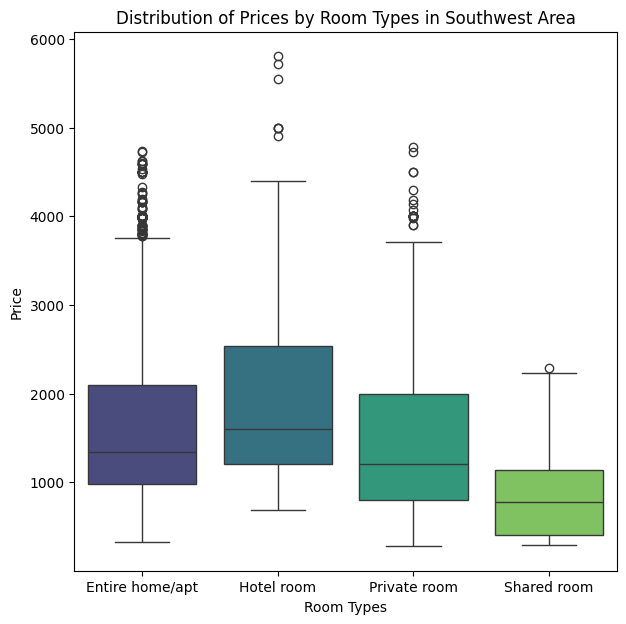

In [243]:
# clean boxplot to see distribution of room_type price side by side
plt.figure(figsize=(7, 7))
sns.boxplot(x = "room_type", y = "price", hue = "room_type", data = southwest_df_cleaned, palette="viridis")
plt.title("Distribution of Prices by Room Types in Southwest Area")
plt.xlabel("Room Types")
plt.ylabel("Price")

# Southeast

In [244]:
# len(southeast_df)

In [245]:
# southeast_df.head()

In [246]:
# southeast_df["neighbourhood"].value_counts()

In [247]:
# southeast_df["room_type"].value_counts()

In [248]:
# room_type price mean
# southeast_df.groupby("room_type")["price"].mean()

In [249]:
# # mean price of room_types in central
# plt.figure(figsize=(7, 7))
# sns.barplot(x = "room_type", y = "price", hue = "room_type", data = southeast_df, estimator=np.mean, errorbar= None, palette="viridis")
# plt.title("Mean Price of Room Types in Southeast Area")
# plt.xlabel("Room Types")
# plt.ylabel("Price Mean")

In [250]:
# room_type price median
# central_df.groupby("room_type")["price"].median()

In [251]:
# # median price of room_types in central
# plt.figure(figsize=(7, 7))
# sns.barplot(x = "room_type", y = "price", hue = "room_type", data = southeast_df, estimator=np.median, errorbar= None, palette="viridis")
# plt.title("Mean Price of Room Types in Southeast Area")
# plt.xlabel("Room Types")
# plt.ylabel("Price Mean")


In [252]:
# # create boxplot to see distribution of room_type price side by side
# plt.figure(figsize=(7, 7))
# sns.boxplot(x = "room_type", y = "price", hue = "room_type", data = southeast_df, palette="viridis")
# plt.title("Distribution of Prices by Room Types in Southeast Area")
# plt.xlabel("Room Types")
# plt.ylabel("Price")

not normally distributed
<br>
handle outliers per room_type

In [253]:
# create dataframes based on room_type
se_eha = southeast_df[southeast_df["room_type"] == "Entire home/apt"]
se_hr = southeast_df[southeast_df["room_type"] == "Hotel room"]
se_pr = southeast_df[southeast_df["room_type"] == "Private room"]
se_sr = southeast_df[southeast_df["room_type"] == "Shared room"]

### entire home/apt

In [254]:
# len(se_eha)

In [255]:
# se_eha.head()

In [256]:
# se_eha.sort_values(by = "price", ascending = False).head()

In [257]:
# # raw data distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = se_eha, x="price", color = "#006884")
# plt.title("Distribution of Entire Home/Apt Prices in Southeast Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

remove extreme outliers

In [258]:
se_eha = se_eha[se_eha["price"] < 20000]

In [259]:
# plt.figure(figsize=(10, 7))
# sns.histplot(data = se_eha, x="price", color = "#006884")
# plt.title("Distribution of Entire Home/Apt Prices in Southeast Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

In [260]:
# len(price_outlier(se_eha)[0])
# len(price_outlier(se_eha)[1])

remove outliers based on iqr

In [261]:
se_eha_cleaned = se_eha[se_eha["price"] < price_outlier(se_eha)[-1]]

In [262]:
# # cleaned distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = se_eha_cleaned, x="price", color = "#006884")
# plt.title("Distribution of Entire Home/Apt Prices in Southeast Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

### hotel room

In [263]:
# len(se_hr)

In [264]:
# se_hr.head()

In [265]:
# se_hr.sort_values(by = "price", ascending = False).head()

In [266]:
# # raw data distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = se_hr, x="price", color = "#006884")
# plt.title("Distribution of Hotel Room Prices in Southeast Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

In [267]:
# len(price_outlier(se_hr)[0])
# len(price_outlier(se_hr)[1])

remove outliers based on iqr

In [268]:
se_hr_cleaned = se_hr[se_hr["price"] < price_outlier(se_hr)[-1]]

In [269]:
# # cleaned data distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = se_hr_cleaned, x="price", color = "#006884")
# plt.title("Distribution of Hotel Room Prices in Southeast Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

### private room

In [270]:
# len(se_pr)

In [271]:
# se_pr.head()

In [272]:
# se_pr.sort_values(by = "price", ascending = False).head()

In [273]:
# # raw data distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = se_pr, x="price", color = "#006884")
# plt.title("Distribution of Private Room Prices in Southeast Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

remove extreme outliers

In [274]:
se_pr = se_pr[se_pr["price"] < 90000]

In [275]:
# plt.figure(figsize=(10, 7))
# sns.histplot(data = se_pr, x="price", color = "#006884")
# plt.title("Distribution of Private Room Prices in Southeast Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

In [276]:
# len(price_outlier(se_pr)[0])
# len(price_outlier(se_pr)[1])

remove outliers based on iqr

In [277]:
se_pr_cleaned = se_pr[se_pr["price"] < price_outlier(se_pr)[-1]]

In [278]:
# # cleaned distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = se_pr_cleaned, x="price", color = "#006884")
# plt.title("Distribution of Private Room Prices in Southeast Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

### shared room

In [279]:
# len(se_sr)

In [280]:
# se_sr.head()

In [281]:
# se_hr.sort_values(by = "price", ascending = False).head()

In [282]:
# # raw data distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = se_sr, x="price", color = "#006884")
# plt.title("Distribution of Shared Room Prices in Southeast Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

remove extreme outlier

In [283]:
se_sr = se_sr[se_sr["price"] < 4000]

In [284]:
# plt.figure(figsize=(10, 7))
# sns.histplot(data = se_sr, x="price", color = "#006884")
# plt.title("Distribution of Shared Room Prices in Southeast Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

In [285]:
# len(price_outlier(se_sr)[0])
# len(price_outlier(se_sr)[1])

remove outliers based on iqr

In [286]:
se_sr_cleaned = se_sr[se_sr["price"] < price_outlier(se_sr)[-1]]

In [287]:
# # cleaned distribution
# plt.figure(figsize=(10, 7))
# sns.histplot(data = se_sr_cleaned, x="price", color = "#006884")
# plt.title("Distribution of Shared Room Prices in Southeast Area")
# plt.xlabel("Price")
# plt.ylabel("Count")
# plt.show()

#### combine all cleaned room_type dataframes for southeast

In [288]:
southeast_df_cleaned = pd.concat([se_eha_cleaned, se_hr_cleaned, se_pr_cleaned, se_sr_cleaned])

In [289]:
# len(southeast_df_cleaned)

In [290]:
# double check if concat worked properly
# len(se_eha_cleaned) + len(se_hr_cleaned) + len(se_pr_cleaned) + len(se_sr_cleaned)

Text(0, 0.5, 'Price')

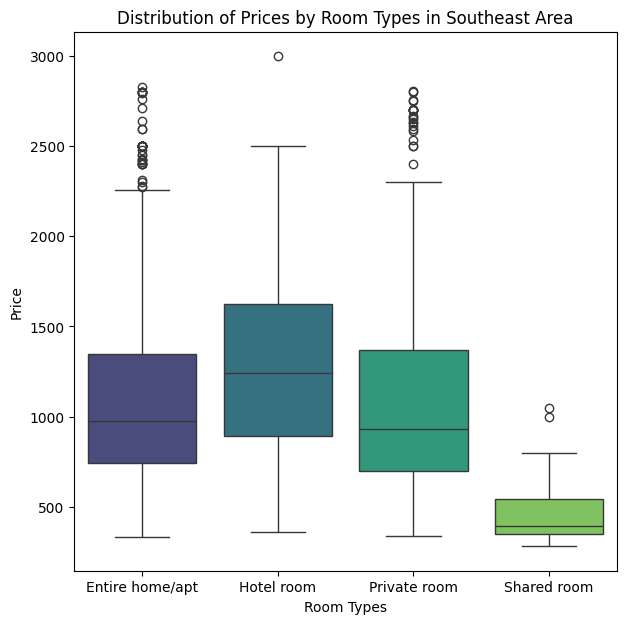

In [291]:
# clean boxplot to see distribution of room_type price side by side
plt.figure(figsize=(7, 7))
sns.boxplot(x = "room_type", y = "price", hue = "room_type", data = southeast_df_cleaned, palette="viridis")
plt.title("Distribution of Prices by Room Types in Southeast Area")
plt.xlabel("Room Types")
plt.ylabel("Price")

#### combine all regional dataframes into one clean df

In [292]:
df = pd.concat([central_df_cleaned, northwest_df_cleaned, northeast_df_cleaned, southwest_df_cleaned, southeast_df_cleaned]).reset_index(drop = True)

In [293]:
eha_df = df[df["room_type"] == "Entire home/apt"]
hr_df = df[df["room_type"] == "Hotel room"]
pr_df = df[df["room_type"] == "Private room"]
sr_df = df[df["room_type"] == "Shared room"]

# Cleaning Reviews Column

since i want to see which region is the best for investment for each room type, i will group by room type first and apply the same review categories across all regions

Text(0.5, 1.0, 'Shared Room')

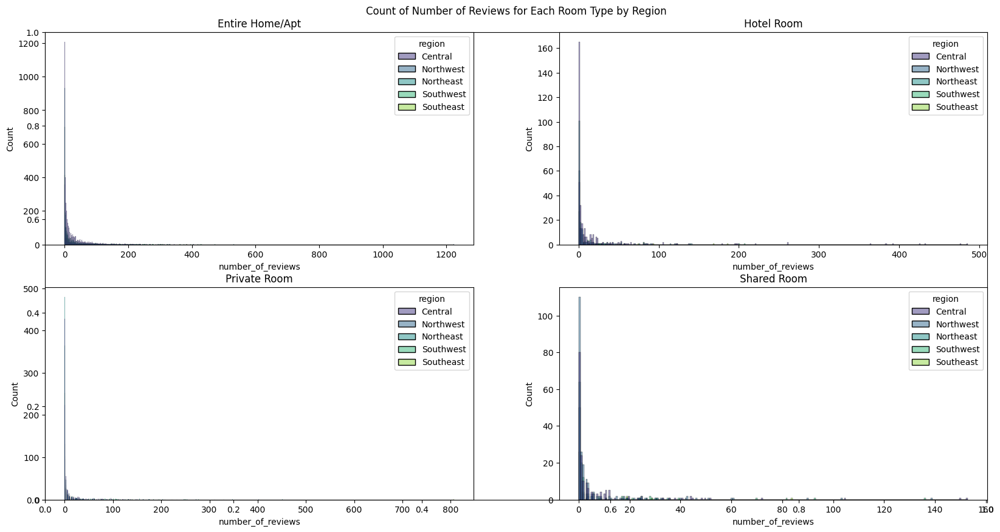

In [294]:
# histplot of numner_of_reviews in all regions for all room types
plt.figure(figsize=(20, 10))
plt.title("Count of Number of Reviews for Each Room Type by Region\n")

plt.subplot(2, 2, 1)
sns.histplot(x = "number_of_reviews", data = eha_df, hue = "region", palette="viridis")
plt.title("Entire Home/Apt")

plt.subplot(2, 2, 2)
sns.histplot(x = "number_of_reviews", data = hr_df, hue = "region", palette="viridis")
plt.title("Hotel Room")

plt.subplot(2, 2, 3)
sns.histplot(x = "number_of_reviews", data = pr_df, hue = "region", palette="viridis")
plt.title("Private Room")

plt.subplot(2, 2, 4)
sns.histplot(x = "number_of_reviews", data = sr_df, hue = "region", palette="viridis")
plt.title("Shared Room")

In [295]:
# # reviews are too skewed to the right - logging
# eha_df.loc[:, "log_reviews_count"] = np.log1p(eha_df["number_of_reviews"].values)
# hr_df.loc[:,"log_reviews_count"] = np.log1p(hr_df["number_of_reviews"].values)
# pr_df.loc[:,"log_reviews_count"] = np.log1p(pr_df["number_of_reviews"].values)
# sr_df.loc[:,"log_reviews_count"] = np.log1p(sr_df["number_of_reviews"].values)

In [296]:
# # histplot of after logging
# plt.figure(figsize=(20, 10))
# plt.title("Logged Number of Reviews for Each Room Type by Region\n")

# plt.subplot(2, 2, 1)
# sns.histplot(x = "log_reviews_count", data = eha_df, hue = "region", palette="viridis")
# plt.title("Entire Home/Apt")

# plt.subplot(2, 2, 2)
# sns.histplot(x = "log_reviews_count", data = hr_df, hue = "region", palette="viridis")
# plt.title("Hotel Room")

# plt.subplot(2, 2, 3)
# sns.histplot(x = "log_reviews_count", data = pr_df, hue = "region", palette="viridis")
# plt.title("Private Room")

# plt.subplot(2, 2, 4)
# sns.histplot(x = "log_reviews_count", data = sr_df, hue = "region", palette="viridis")
# plt.title("Shared Room")

In [297]:
# # define new column for number_of_reviews ordinal - reviews_activity came from number_of_reviews
# def ordinal_reviews_count(df):
#     q1 = df["log_reviews_count"].quantile(0.33)
#     q2 = df["log_reviews_count"].quantile(0.66)

#     bins = [df["log_reviews_count"].min(), q1 + 0.01, q2, df["log_reviews_count"].max()]
#     labels = ["Low", "Moderate", "High"]
#     df.loc[:, "reviews_activity"] = pd.cut(df["log_reviews_count"], bins=bins, labels=labels, include_lowest=True)

#     return df

In [298]:
# eha_df = ordinal_reviews_count(eha_df)
# hr_df = ordinal_reviews_count(hr_df)
# pr_df = ordinal_reviews_count(pr_df)
# sr_df = ordinal_reviews_count(sr_df)

Text(0.5, 1.0, 'Shared Room')

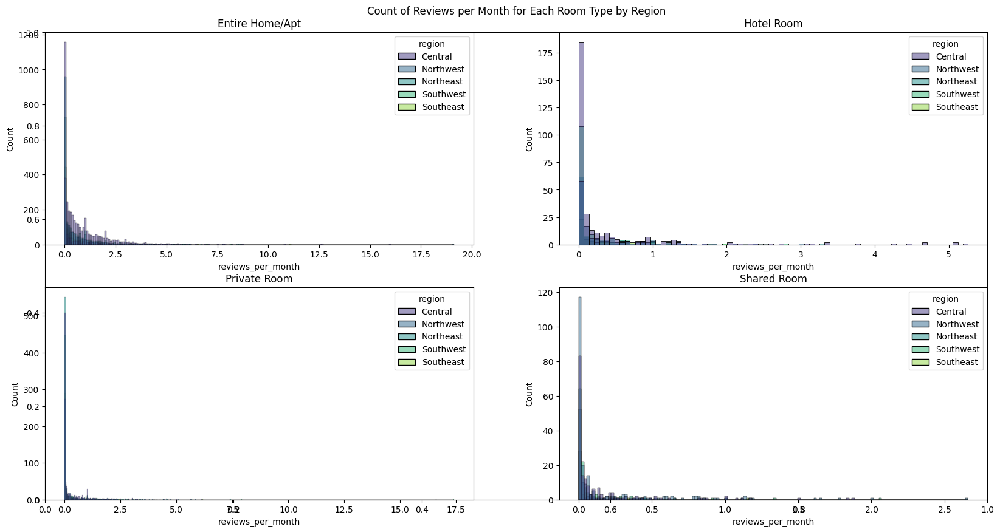

In [299]:
# histplot of reviews_per_month in all regions for all room types
plt.figure(figsize=(20, 10))
plt.title("Count of Reviews per Month for Each Room Type by Region\n")

plt.subplot(2, 2, 1)
sns.histplot(x = "reviews_per_month", data = eha_df, hue = "region", palette="viridis")
plt.title("Entire Home/Apt")

plt.subplot(2, 2, 2)
sns.histplot(x = "reviews_per_month", data = hr_df, hue = "region", palette="viridis")
plt.title("Hotel Room")

plt.subplot(2, 2, 3)
sns.histplot(x = "reviews_per_month", data = pr_df, hue = "region", palette="viridis")
plt.title("Private Room")

plt.subplot(2, 2, 4)
sns.histplot(x = "reviews_per_month", data = sr_df, hue = "region", palette="viridis")
plt.title("Shared Room")

In [300]:
# # reviews are too skewed to the right - logging
# eha_df.loc[:, "log_reviews_month"] = np.log1p(eha_df["reviews_per_month"])
# hr_df.loc[:, "log_reviews_month"] = np.log1p(hr_df["reviews_per_month"])
# pr_df.loc[:, "log_reviews_month"] = np.log1p(pr_df["reviews_per_month"])
# sr_df.loc[:, "log_reviews_month"] = np.log1p(sr_df["reviews_per_month"])

In [301]:
# # histplot of after logging
# plt.figure(figsize=(20, 10))
# plt.title("Logged Reviews per Month for Each Room Type by Region\n")

# plt.subplot(2, 2, 1)
# sns.histplot(x = "log_reviews_month", data = eha_df, hue = "region", palette="viridis")
# plt.title("Entire Home/Apt")

# plt.subplot(2, 2, 2)
# sns.histplot(x = "log_reviews_month", data = hr_df, hue = "region", palette="viridis")
# plt.title("Hotel Room")

# plt.subplot(2, 2, 3)
# sns.histplot(x = "log_reviews_month", data = pr_df, hue = "region", palette="viridis")
# plt.title("Private Room")

# plt.subplot(2, 2, 4)
# sns.histplot(x = "log_reviews_month", data = sr_df, hue = "region", palette="viridis")
# plt.title("Shared Room")

In [302]:
# # reviews are too still skewed to the right - squaring
# eha_df.loc[:, "sqrt_reviews_month"] = np.sqrt(eha_df["reviews_per_month"])
# hr_df.loc[:, "sqrt_reviews_month"] = np.sqrt(hr_df["reviews_per_month"])
# pr_df.loc[:, "sqrt_reviews_month"] = np.sqrt(pr_df["reviews_per_month"])
# sr_df.loc[:, "sqrt_reviews_month"] = np.sqrt(sr_df["reviews_per_month"])

In [303]:
# # histplot of after squaring
# plt.figure(figsize=(20, 10))
# plt.title("Squared Reviews per Month for Each Room Type by Region\n")

# plt.subplot(2, 2, 1)
# sns.histplot(x = "sqrt_reviews_month", data = eha_df, hue = "region", palette="viridis")
# plt.title("Entire Home/Apt")

# plt.subplot(2, 2, 2)
# sns.histplot(x = "sqrt_reviews_month", data = hr_df, hue = "region", palette="viridis")
# plt.title("Hotel Room")

# plt.subplot(2, 2, 3)
# sns.histplot(x = "sqrt_reviews_month", data = pr_df, hue = "region", palette="viridis")
# plt.title("Private Room")

# plt.subplot(2, 2, 4)
# sns.histplot(x = "sqrt_reviews_month", data = sr_df, hue = "region", palette="viridis")
# plt.title("Shared Room")

In [304]:
from scipy import stats

In [305]:
# reviews count are too still skewed to the right - box-cox
eha_df.loc[:, "boxcox_reviews_count"], _ = stats.boxcox(eha_df["number_of_reviews"] + 1)
hr_df.loc[:, "boxcox_reviews_count"], _ = stats.boxcox(hr_df["number_of_reviews"] + 1)
pr_df.loc[:, "boxcox_reviews_count"], _ = stats.boxcox(pr_df["number_of_reviews"] + 1)
sr_df.loc[:, "boxcox_reviews_count"], _ = stats.boxcox(sr_df["number_of_reviews"] + 1)

C:\Users\amfed\AppData\Local\Temp\ipykernel_21776\4072897318.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eha_df.loc[:, "boxcox_reviews_count"], _ = stats.boxcox(eha_df["number_of_reviews"] + 1)
C:\Users\amfed\AppData\Local\Temp\ipykernel_21776\4072897318.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hr_df.loc[:, "boxcox_reviews_count"], _ = stats.boxcox(hr_df["number_of_reviews"] + 1)
C:\Users\amfed\AppData\Local\Temp\ipykernel_21776\4072897318.py:4: SettingWithCopyWarning: 
A value is trying 

Text(0.5, 1.0, 'Shared Room')

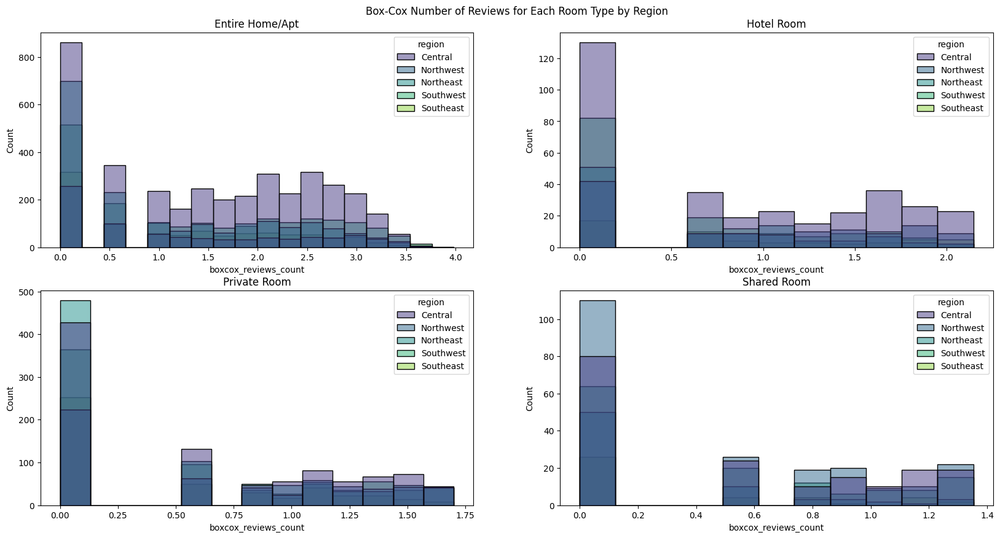

In [306]:
# histplot of after boxcox
plt.figure(figsize=(20, 10))
plt.title("Box-Cox Number of Reviews for Each Room Type by Region\n")
plt.box(on= None)
plt.axis("off")

plt.subplot(2, 2, 1)
sns.histplot(x = "boxcox_reviews_count", data = eha_df, hue = "region", palette="viridis")
plt.title("Entire Home/Apt")

plt.subplot(2, 2, 2)
sns.histplot(x = "boxcox_reviews_count", data = hr_df, hue = "region", palette="viridis")
plt.title("Hotel Room")

plt.subplot(2, 2, 3)
sns.histplot(x = "boxcox_reviews_count", data = pr_df, hue = "region", palette="viridis")
plt.title("Private Room")

plt.subplot(2, 2, 4)
sns.histplot(x = "boxcox_reviews_count", data = sr_df, hue = "region", palette="viridis")
plt.title("Shared Room")

In [307]:
# reviews per month are too still skewed to the right - box-cox
eha_df.loc[:, "boxcox_reviews_month"], _ = stats.boxcox(eha_df["reviews_per_month"] + 1)
hr_df.loc[:, "boxcox_reviews_month"], _ = stats.boxcox(hr_df["reviews_per_month"] + 1)
pr_df.loc[:, "boxcox_reviews_month"], _ = stats.boxcox(pr_df["reviews_per_month"] + 1)
sr_df.loc[:, "boxcox_reviews_month"], _ = stats.boxcox(sr_df["reviews_per_month"] + 1)

C:\Users\amfed\AppData\Local\Temp\ipykernel_21776\3827868114.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  eha_df.loc[:, "boxcox_reviews_month"], _ = stats.boxcox(eha_df["reviews_per_month"] + 1)
C:\Users\amfed\AppData\Local\Temp\ipykernel_21776\3827868114.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hr_df.loc[:, "boxcox_reviews_month"], _ = stats.boxcox(hr_df["reviews_per_month"] + 1)
C:\Users\amfed\AppData\Local\Temp\ipykernel_21776\3827868114.py:4: SettingWithCopyWarning: 
A value is trying 

Text(0.5, 1.0, 'Shared Room')

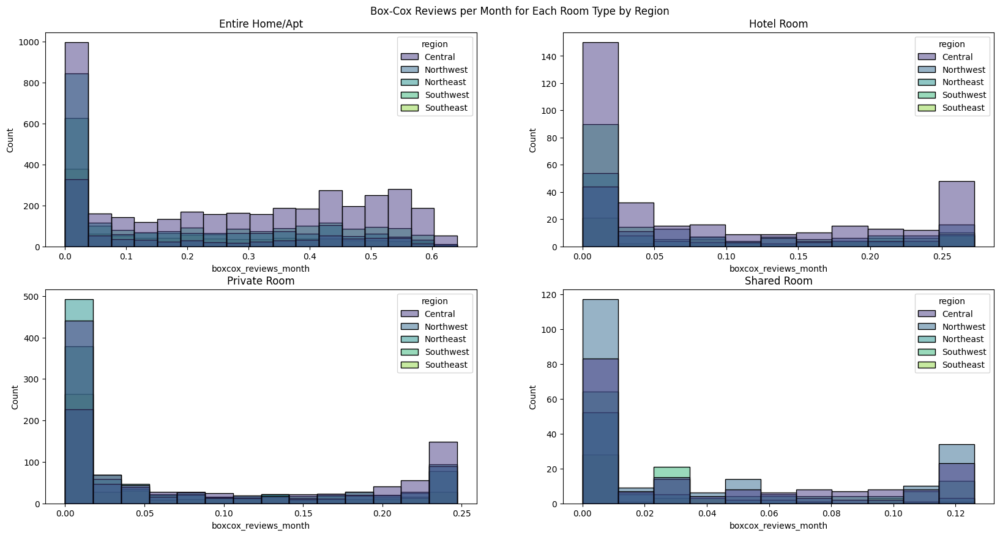

In [308]:
# histplot of after boxcox
plt.figure(figsize=(20, 10))
plt.title("Box-Cox Reviews per Month for Each Room Type by Region\n")
plt.box(on= None)
plt.axis("off")

plt.subplot(2, 2, 1)
sns.histplot(x = "boxcox_reviews_month", data = eha_df, hue = "region", palette="viridis")
plt.title("Entire Home/Apt")

plt.subplot(2, 2, 2)
sns.histplot(x = "boxcox_reviews_month", data = hr_df, hue = "region", palette="viridis")
plt.title("Hotel Room")

plt.subplot(2, 2, 3)
sns.histplot(x = "boxcox_reviews_month", data = pr_df, hue = "region", palette="viridis")
plt.title("Private Room")

plt.subplot(2, 2, 4)
sns.histplot(x = "boxcox_reviews_month", data = sr_df, hue = "region", palette="viridis")
plt.title("Shared Room")

In [309]:
eha_df.head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,region,boxcox_reviews_count,boxcox_reviews_month
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,65,2020-01-06,0.50,2,353,0,Central,2.928458,0.301359
1,959254,"Deluxe Condo, Nana, Pool/GYM/Sauna",5153476,Natcha,Khlong Toei,13.71516,100.56806,Entire home/apt,1400,30,0,No Review,0.00,1,365,0,Central,0.000000,0.000000
2,1791481,Nice and Quiet condo near BTS Onnut,9399478,Piyakorn,Khlong Toei,13.70719,100.59936,Entire home/apt,1577,30,78,2019-05-31,0.78,1,330,0,Central,3.010781,0.381783
3,1793000,The Duplex - Asoke- Luxury 92sqm,9407280,Timo,Vadhana,13.74668,100.56137,Entire home/apt,5034,21,287,2022-11-22,2.59,1,349,3,Central,3.529709,0.557674
4,1808600,Contemporary Modern Duplex-Thong Lo,9478184,Shine,Khlong Toei,13.72097,100.57823,Entire home/apt,2078,60,83,2018-09-12,0.75,1,55,0,Central,3.038267,0.374712


In [310]:
def ordinal_reviews_count(df):
    q1 = df["boxcox_reviews_count"].quantile(0.33)
    q2 = df["boxcox_reviews_count"].quantile(0.66)

    bins = [df["boxcox_reviews_count"].min(), q1 + 0.01, q2, df["boxcox_reviews_count"].max()]
    labels = ["Low", "Moderate", "High"]

    df = df.copy()  # Ensure we're working with a copy to avoid SettingWithCopyWarning
    df.loc[:, "reviews_activity"] = pd.cut(df["boxcox_reviews_count"], bins=bins, labels=labels, include_lowest=True)

    return df  # Return the modified DataFrame


In [311]:
eha_df = ordinal_reviews_count(eha_df)
hr_df = ordinal_reviews_count(hr_df)
pr_df = ordinal_reviews_count(pr_df)
sr_df = ordinal_reviews_count(sr_df)

In [312]:
def ordinal_reviews_month(df):
    q1 = df["boxcox_reviews_month"].quantile(0.33)
    q2 = df["boxcox_reviews_month"].quantile(0.66)

    bins = [df["boxcox_reviews_month"].min(), q1 + 0.01, q2, df["boxcox_reviews_month"].max()]
    labels = ["Low", "Moderate", "High"]

    df = df.copy()  # Ensure we're working with a copy to avoid SettingWithCopyWarning
    df.loc[:, "reviews_engagement"] = pd.cut(df["boxcox_reviews_month"], bins=bins, labels=labels, include_lowest=True)

    return df  # Return the modified DataFrame

In [313]:
eha_df = ordinal_reviews_month(eha_df)
hr_df = ordinal_reviews_month(hr_df)
pr_df = ordinal_reviews_month(pr_df)
sr_df = ordinal_reviews_month(sr_df)

In [314]:
eha_df.head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,...,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,region,boxcox_reviews_count,boxcox_reviews_month,reviews_activity,reviews_engagement
0,27934,Nice room with superb city view,120437,Nuttee,Ratchathewi,13.75983,100.54134,Entire home/apt,1905,3,...,2020-01-06,0.50,2,353,0,Central,2.928458,0.301359,High,Moderate
1,959254,"Deluxe Condo, Nana, Pool/GYM/Sauna",5153476,Natcha,Khlong Toei,13.71516,100.56806,Entire home/apt,1400,30,...,No Review,0.00,1,365,0,Central,0.000000,0.000000,Low,Low
2,1791481,Nice and Quiet condo near BTS Onnut,9399478,Piyakorn,Khlong Toei,13.70719,100.59936,Entire home/apt,1577,30,...,2019-05-31,0.78,1,330,0,Central,3.010781,0.381783,High,High
3,1793000,The Duplex - Asoke- Luxury 92sqm,9407280,Timo,Vadhana,13.74668,100.56137,Entire home/apt,5034,21,...,2022-11-22,2.59,1,349,3,Central,3.529709,0.557674,High,High
4,1808600,Contemporary Modern Duplex-Thong Lo,9478184,Shine,Khlong Toei,13.72097,100.57823,Entire home/apt,2078,60,...,2018-09-12,0.75,1,55,0,Central,3.038267,0.374712,High,High


In [315]:
df = pd.concat([eha_df, hr_df, pr_df, sr_df])

In [316]:
df.isna().sum()

id                                0
name                              0
host_id                           0
host_name                         0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
last_review                       0
reviews_per_month                 0
calculated_host_listings_count    0
availability_365                  0
number_of_reviews_ltm             0
region                            0
boxcox_reviews_count              0
boxcox_reviews_month              0
reviews_activity                  0
reviews_engagement                0
dtype: int64

In [317]:
df_clean = df.drop(columns=["name", "host_name", "latitude", "longitude", "number_of_reviews", "last_review", "reviews_per_month", "calculated_host_listings_count", "availability_365", "number_of_reviews_ltm"])

In [318]:
df_clean.head()

,id,host_id,neighbourhood,room_type,price,minimum_nights,region,boxcox_reviews_count,boxcox_reviews_month,reviews_activity,reviews_engagement
0,27934,120437,Ratchathewi,Entire home/apt,1905,3,Central,2.928458,0.301359,High,Moderate
1,959254,5153476,Khlong Toei,Entire home/apt,1400,30,Central,0.000000,0.000000,Low,Low
2,1791481,9399478,Khlong Toei,Entire home/apt,1577,30,Central,3.010781,0.381783,High,High
3,1793000,9407280,Vadhana,Entire home/apt,5034,21,Central,3.529709,0.557674,High,High
4,1808600,9478184,Khlong Toei,Entire home/apt,2078,60,Central,3.038267,0.374712,High,High


In [319]:
df_clean = df_clean.rename(columns={"boxcox_reviews_count": "reviews_count_bc", "boxcox_reviews_month": "reviews_month_bc"})

In [320]:
df_clean.head()

,id,host_id,neighbourhood,room_type,price,minimum_nights,region,reviews_count_bc,reviews_month_bc,reviews_activity,reviews_engagement
0,27934,120437,Ratchathewi,Entire home/apt,1905,3,Central,2.928458,0.301359,High,Moderate
1,959254,5153476,Khlong Toei,Entire home/apt,1400,30,Central,0.000000,0.000000,Low,Low
2,1791481,9399478,Khlong Toei,Entire home/apt,1577,30,Central,3.010781,0.381783,High,High
3,1793000,9407280,Vadhana,Entire home/apt,5034,21,Central,3.529709,0.557674,High,High
4,1808600,9478184,Khlong Toei,Entire home/apt,2078,60,Central,3.038267,0.374712,High,High


In [321]:
df_clean = df_clean[["id", "host_id", "neighbourhood", "region", "room_type", "price", "minimum_nights", "reviews_count_bc", "reviews_activity", "reviews_month_bc", "reviews_engagement"]]

In [322]:
df_clean.head()

,id,host_id,neighbourhood,region,room_type,price,minimum_nights,reviews_count_bc,reviews_activity,reviews_month_bc,reviews_engagement
0,27934,120437,Ratchathewi,Central,Entire home/apt,1905,3,2.928458,High,0.301359,Moderate
1,959254,5153476,Khlong Toei,Central,Entire home/apt,1400,30,0.000000,Low,0.000000,Low
2,1791481,9399478,Khlong Toei,Central,Entire home/apt,1577,30,3.010781,High,0.381783,High
3,1793000,9407280,Vadhana,Central,Entire home/apt,5034,21,3.529709,High,0.557674,High
4,1808600,9478184,Khlong Toei,Central,Entire home/apt,2078,60,3.038267,High,0.374712,High


In [323]:
df_clean.to_csv("Airbnb Listings Bangkok Clean.csv")